# 古画yolov3物体检测

**下载数据集**

In [1]:
!mkdir tarfile
from modelarts.session import Session
sess = Session()
for i in range(100):
    sess.download_data(bucket_path=f"gg-image/task/tarfile/{i}.tar.gz", path=f"tarfile/{i}.tar.gz")

Successfully download file gg-image/task/tarfile/0.tar.gz from OBS to local tarfile/0.tar.gz
Successfully download file gg-image/task/tarfile/1.tar.gz from OBS to local tarfile/1.tar.gz
Successfully download file gg-image/task/tarfile/2.tar.gz from OBS to local tarfile/2.tar.gz
Successfully download file gg-image/task/tarfile/3.tar.gz from OBS to local tarfile/3.tar.gz
Successfully download file gg-image/task/tarfile/4.tar.gz from OBS to local tarfile/4.tar.gz
Successfully download file gg-image/task/tarfile/5.tar.gz from OBS to local tarfile/5.tar.gz
Successfully download file gg-image/task/tarfile/6.tar.gz from OBS to local tarfile/6.tar.gz
Successfully download file gg-image/task/tarfile/7.tar.gz from OBS to local tarfile/7.tar.gz
Successfully download file gg-image/task/tarfile/8.tar.gz from OBS to local tarfile/8.tar.gz
Successfully download file gg-image/task/tarfile/9.tar.gz from OBS to local tarfile/9.tar.gz
Successfully download file gg-image/task/tarfile/10.tar.gz from OBS to

Successfully download file gg-image/task/tarfile/87.tar.gz from OBS to local tarfile/87.tar.gz
Successfully download file gg-image/task/tarfile/88.tar.gz from OBS to local tarfile/88.tar.gz
Successfully download file gg-image/task/tarfile/89.tar.gz from OBS to local tarfile/89.tar.gz
Successfully download file gg-image/task/tarfile/90.tar.gz from OBS to local tarfile/90.tar.gz
Successfully download file gg-image/task/tarfile/91.tar.gz from OBS to local tarfile/91.tar.gz
Successfully download file gg-image/task/tarfile/92.tar.gz from OBS to local tarfile/92.tar.gz
Successfully download file gg-image/task/tarfile/93.tar.gz from OBS to local tarfile/93.tar.gz
Successfully download file gg-image/task/tarfile/94.tar.gz from OBS to local tarfile/94.tar.gz
Successfully download file gg-image/task/tarfile/95.tar.gz from OBS to local tarfile/95.tar.gz
Successfully download file gg-image/task/tarfile/96.tar.gz from OBS to local tarfile/96.tar.gz
Successfully download file gg-image/task/tarfile/9

**解压数据集**

In [2]:
import os, tarfile
path = 'tarfile'
savefolder = 'data'
for filename in os.listdir(path):
    filepath = os.path.join(path, filename)
    tf = tarfile.open(filepath)
    tf.extractall(savefolder)
    tf.close()
    os.remove(filepath)   

**下载代码**

In [3]:
# !rm yolov3.tar.gz
sess.download_data(bucket_path="gg-image/task/notebook/yolov3.tar.gz", path=f"./yolov3.tar.gz")

rm: cannot remove 'yolov3.tar.gz': No such file or directory
Successfully download file gg-image/task/notebook/yolov3.tar.gz from OBS to local ./yolov3.tar.gz


**解压代码**

In [4]:
!tar -zxf yolov3.tar.gz
!rm yolov3.tar.gz

**显示图片**

In [10]:
# 生成标签对应的颜色
from src.util import produceColors, classes, path
colors = produceColors(classes)
print('classes:', classes)
print('colors:', colors)
print('path:', path)

classes: ['person', 'bird', 'flower']
colors: {'person': (255, 0, 0), 'bird': (0, 255, 0), 'flower': (0, 0, 255)}
path: /home/ma-user/work/data


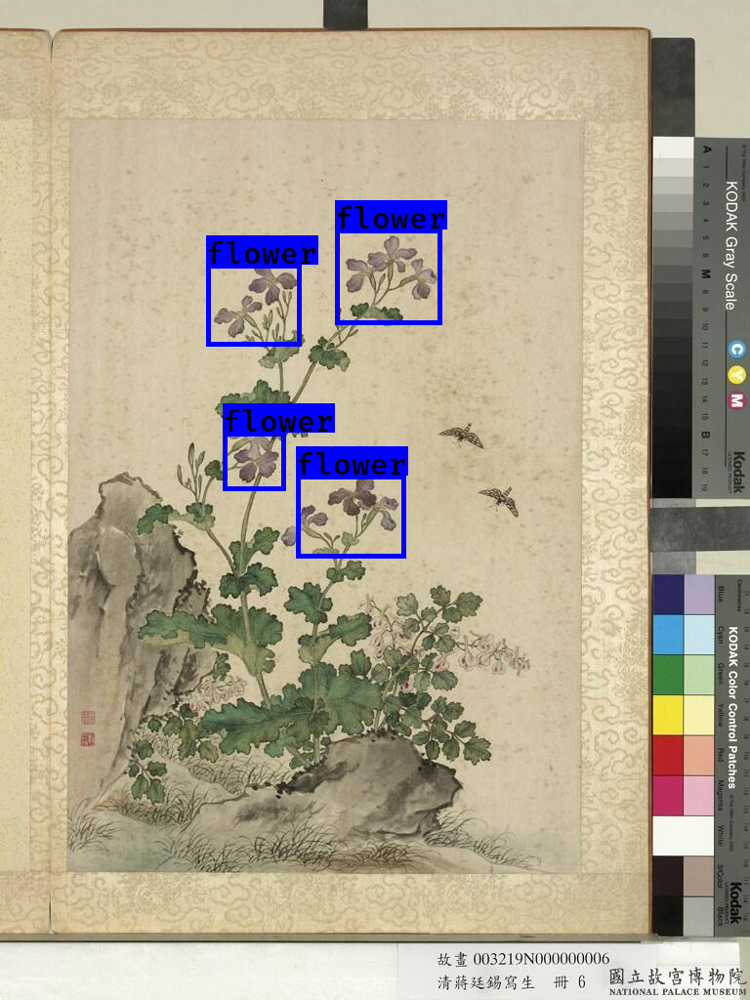

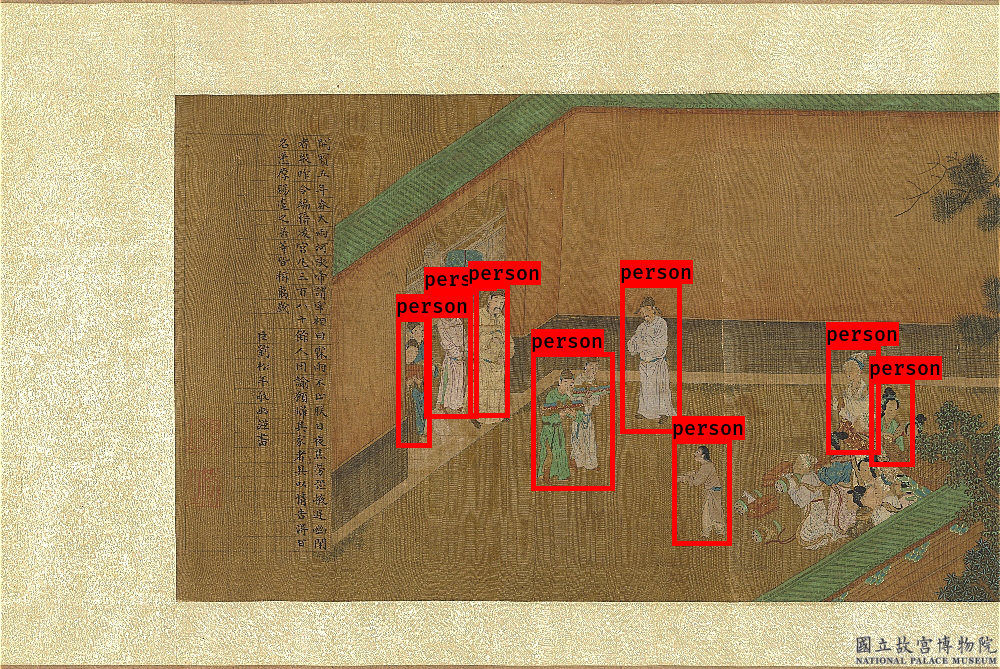

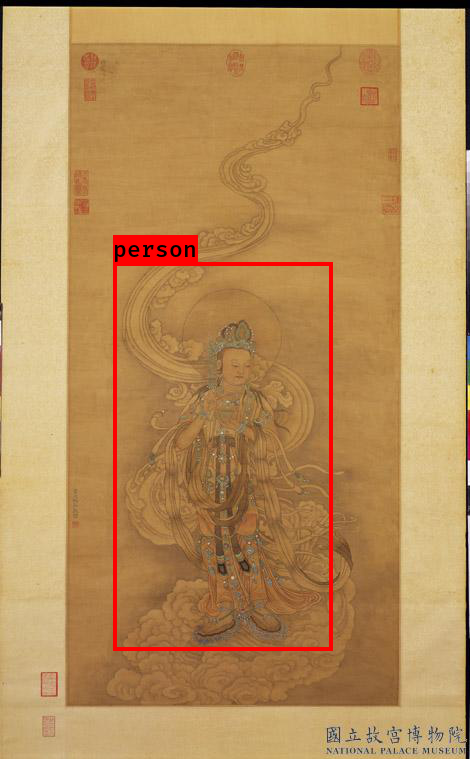

In [11]:
import os
from IPython.display import display
from src.util import getFiles, getImageFile, draw_image
# 随机选3张标注文件并显示
for xml_file in getFiles(path, 3):
    img_file = getImageFile(xml_file)
    display(draw_image(img_file, colors))

**将数据分成训练集和测试集**

In [13]:
# 数据分成训练集和测试集时并不改变数据源的位置，而是通过建立trainFile和testFile2个文件来区分
# trainFile记录了所有训练集图片的路径和标注结果，testFile记录了所有测试集图片的路径和标注结果
from src.util import divide, saveAsText
trainFile = 'oldDrawingTrain.txt'
testFile = 'oldDrawingTest.txt'
# 在src.util给了个训练集和测试集使用的标准方法divide()
##### 对于需要进行拓展工作的，不满足以divide()默认方式分开训练集和验证集方式的可更改divide()的参数
##### divide接受2个参数；ratio: 训练集所占的比例，seed: 随机种子（一个整数或None），值为None时为随机生成
##### 比如需要取训练集为随机300个图片，剩余为测试集，考虑所有图片数为7939，可以写作
##### train, test = divide(300/7939, None)
train, test = divide()
saveAsText(train, trainFile)
saveAsText(test, testFile)

## 2. yolov3训练

**指定训练相关的文件路径等参数**

In [1]:
from oldDrawingTrain import get_anchors
from src.util import classes
annotation_path = 'oldDrawingTrain.txt'
weights_path="./model_data/yolo_weights.h5"
log_dir = 'logs/'
anchors_path = 'model_data/yolo_anchors.txt'
class_names = classes
num_classes = len(class_names)
anchors = get_anchors(anchors_path)
num_anchors = len(anchors)

Using TensorFlow backend.


**构建YOLO模型**

In [2]:
import keras.backend as K
from yolo3.model import preprocess_true_boxes, yolo_body, yolo_loss
from keras.layers import Input, Lambda
from keras.models import Model

K.clear_session()

input_shape = (416,416)
image_input = Input(shape=(None, None, 3))
h, w = input_shape

y_true = [Input(shape=(h//{0:32, 1:16, 2:8}[l], w//{0:32, 1:16, 2:8}[l], num_anchors//3, num_classes+5)) 
          for l in range(3)]
model_body = yolo_body(image_input, num_anchors//3, num_classes)

model_body.load_weights(weights_path, by_name=True, skip_mismatch=True)

model_loss = Lambda(yolo_loss, output_shape=(1,), name='yolo_loss',
    arguments={'anchors': anchors, 'num_classes': num_classes, 'ignore_thresh': 0.5})(
    [*model_body.output, *y_true])

model = Model([model_body.input, *y_true], model_loss)

Instructions for updating:
Colocations handled automatically by placer.


/home/ma-user/anaconda3/envs/TensorFlow-1.13.1/lib/python3.6/site-packages/keras/engine/saving.py:1009: UserWarning: Skipping loading of weights for layer conv2d_59 due to mismatch in shape ((1, 1, 1024, 24) vs (255, 1024, 1, 1)).
  weight_values[i].shape))
/home/ma-user/anaconda3/envs/TensorFlow-1.13.1/lib/python3.6/site-packages/keras/engine/saving.py:1009: UserWarning: Skipping loading of weights for layer conv2d_59 due to mismatch in shape ((24,) vs (255,)).
  weight_values[i].shape))
/home/ma-user/anaconda3/envs/TensorFlow-1.13.1/lib/python3.6/site-packages/keras/engine/saving.py:1009: UserWarning: Skipping loading of weights for layer conv2d_67 due to mismatch in shape ((1, 1, 512, 24) vs (255, 512, 1, 1)).
  weight_values[i].shape))
/home/ma-user/anaconda3/envs/TensorFlow-1.13.1/lib/python3.6/site-packages/keras/engine/saving.py:1009: UserWarning: Skipping loading of weights for layer conv2d_67 due to mismatch in shape ((24,) vs (255,)).
  weight_values[i].shape))
/home/ma-user/

**显示模型**

In [3]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, None, None, 3 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, None, None, 3 128         conv2d_1[0][0]                   
__________________________________________________________________________________________________
leaky_re_lu_1 (LeakyReLU)       (None, None, None, 3 0           batch_normalization_1[0][0]      
__________________________________________________________________________________________________
zero_paddi

**训练callbacks定义**

In [4]:
from keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1)

**读取数据**

In [5]:
import numpy as np
val_split = 0.1
with open(annotation_path) as f:
    lines = f.readlines()
np.random.seed(10101)
np.random.shuffle(lines)
np.random.seed(None)
num_val = int(len(lines)*val_split)
num_train = len(lines) - num_val

**读取数据函数**

In [6]:
def data_generator(annotation_lines, batch_size, input_shape, anchors, num_classes):
    '''data generator for fit_generator'''
    n = len(annotation_lines)
    i = 0
    while True:
        image_data = []
        box_data = []
        for b in range(batch_size):
            if i==0:
                np.random.shuffle(annotation_lines)
            image, box = get_random_data(annotation_lines[i], input_shape, random=True)
            image_data.append(image)
            box_data.append(box)
            i = (i+1) % n
        image_data = np.array(image_data)
        box_data = np.array(box_data)
        y_true = preprocess_true_boxes(box_data, input_shape, anchors, num_classes)
        yield [image_data, *y_true], np.zeros(batch_size)

def data_generator_wrapper(annotation_lines, batch_size, input_shape, anchors, num_classes):
    n = len(annotation_lines)
    if n==0 or batch_size<=0: return None
    return data_generator(annotation_lines, batch_size, input_shape, anchors, num_classes)

**训练周期数设定**

In [7]:
import os
os.makedirs(log_dir, exist_ok=True)
frozen_train_epoch = 5
fine_tuning_epoch = 5

**冻结时训练参数**

In [8]:
from keras.optimizers import Adam
from yolo3.utils import get_random_data 
if frozen_train_epoch:
    model.compile(optimizer=Adam(lr=1e-3), loss={
        # use custom yolo_loss Lambda layer.
        'yolo_loss': lambda y_true, y_pred: y_pred})

    batch_size = 8
    print('Train on {} samples, val on {} samples, with batch size {}.'.format(num_train, num_val, batch_size))
    model.fit_generator(data_generator_wrapper(lines[:num_train], batch_size, input_shape, anchors, num_classes),
            steps_per_epoch=max(1, num_train//batch_size),
            validation_data=data_generator_wrapper(lines[num_train:], batch_size, input_shape, anchors, num_classes),
            validation_steps=max(1, num_val//batch_size),
            epochs=frozen_train_epoch,
            initial_epoch=0,
            callbacks=[])
    model.save_weights(log_dir + 'trained_weights_stage_1.h5')

Train on 4287 samples, val on 476 samples, with batch size 8.
Epoch 1/5
535/535 [==============================] - 358s 669ms/step - loss: 121.2328 - val_loss: 43.5569
Epoch 2/5
535/535 [==============================] - 332s 621ms/step - loss: 45.2910 - val_loss: 38.0415
Epoch 3/5
535/535 [==============================] - 335s 626ms/step - loss: 41.9102 - val_loss: 37.2522
Epoch 4/5
535/535 [==============================] - 339s 634ms/step - loss: 40.9120 - val_loss: 35.4150
Epoch 5/5
535/535 [==============================] - 337s 630ms/step - loss: 59.7642 - val_loss: 454135.6431


**fine tuning**

In [ ]:
for i in range(len(model.layers)):
    model.layers[i].trainable = True
model.compile(optimizer=Adam(lr=1e-4), loss={'yolo_loss': lambda y_true, y_pred: y_pred}) # recompile to apply the change
print('Unfreeze all of the layers.')

batch_size = 2 # note that more GPU memory is required after unfreezing the body
print('Train on {} samples, val on {} samples, with batch size {}.'.format(num_train, num_val, batch_size))
model.fit_generator(data_generator_wrapper(lines[:num_train], batch_size, input_shape, anchors, num_classes),
    steps_per_epoch=max(1, num_train//batch_size),
    validation_data=data_generator_wrapper(lines[num_train:], batch_size, input_shape, anchors, num_classes),
    validation_steps=max(1, num_val//batch_size),
    epochs=frozen_train_epoch+fine_tuning_epoch,
    initial_epoch=frozen_train_epoch,
    callbacks=[reduce_lr, early_stopping])
model.save_weights(log_dir + 'trained_weights_final.h5')

Unfreeze all of the layers.
Train on 4287 samples, val on 476 samples, with batch size 2.
Epoch 6/10
2143/2143 [==============================] - 401s 187ms/step - loss: 63.9933 - val_loss: 81.5493
Epoch 7/10
2143/2143 [==============================] - 378s 176ms/step - loss: 55.0096 - val_loss: 182.4871
Epoch 8/10
2143/2143 [==============================] - 378s 176ms/step - loss: 50.0493 - val_loss: 52.6781
Epoch 9/10
2143/2143 [==============================] - 379s 177ms/step - loss: 47.5252 - val_loss: 47.6857
Epoch 10/10
2142/2143 [============================>.] - ETA: 0s - loss: 45.6222

## 训练结果展示

**展示测试集前几张图片**

In [4]:
# 在预测之前，需要将（可能发生的）之前预测的结果删除
!rm input/detection-results/*
!rm input/ground-truth/*
!rm -rf results
!rm -rf test_result
!mkdir -p input/detection-results
!mkdir -p input/ground-truth
!mkdir test_result

rm: cannot remove 'input/detection-results/*': No such file or directory
rm: cannot remove 'input/ground-truth/*': No such file or directory


logs/trained_weights_final.h5 model, anchors, and classes loaded.
(416, 416, 3)
Found 0 boxes for img
3.972397169098258
(416, 416, 3)
Found 0 boxes for img
0.055635412223637104
(416, 416, 3)
Found 0 boxes for img
0.05384439788758755
(416, 416, 3)
Found 0 boxes for img
0.04201371408998966
(416, 416, 3)
Found 0 boxes for img
0.04886780818924308
(416, 416, 3)
Found 0 boxes for img
0.04431925993412733
(416, 416, 3)
Found 0 boxes for img
0.08189580822363496
(416, 416, 3)
Found 0 boxes for img
0.053870758041739464
(416, 416, 3)
Found 1 boxes for img
person 0.38 (255, 453) (313, 586)
0.05450587905943394
(416, 416, 3)
Found 0 boxes for img
0.04383068485185504


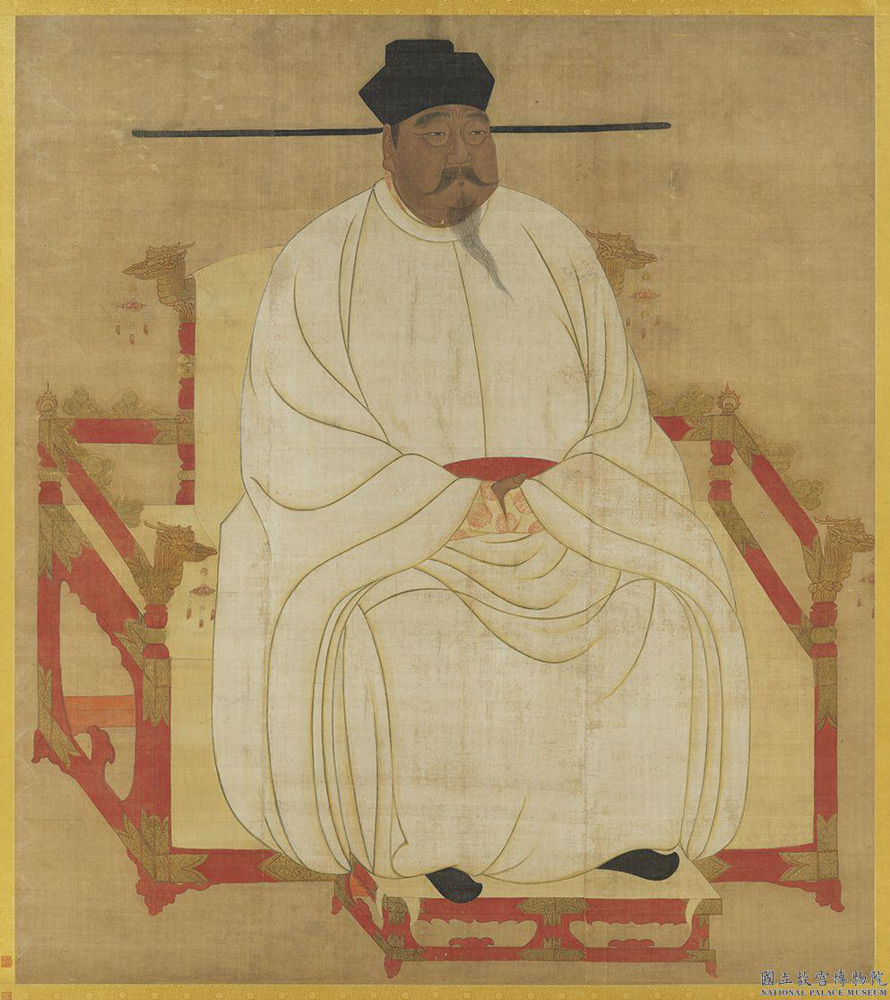

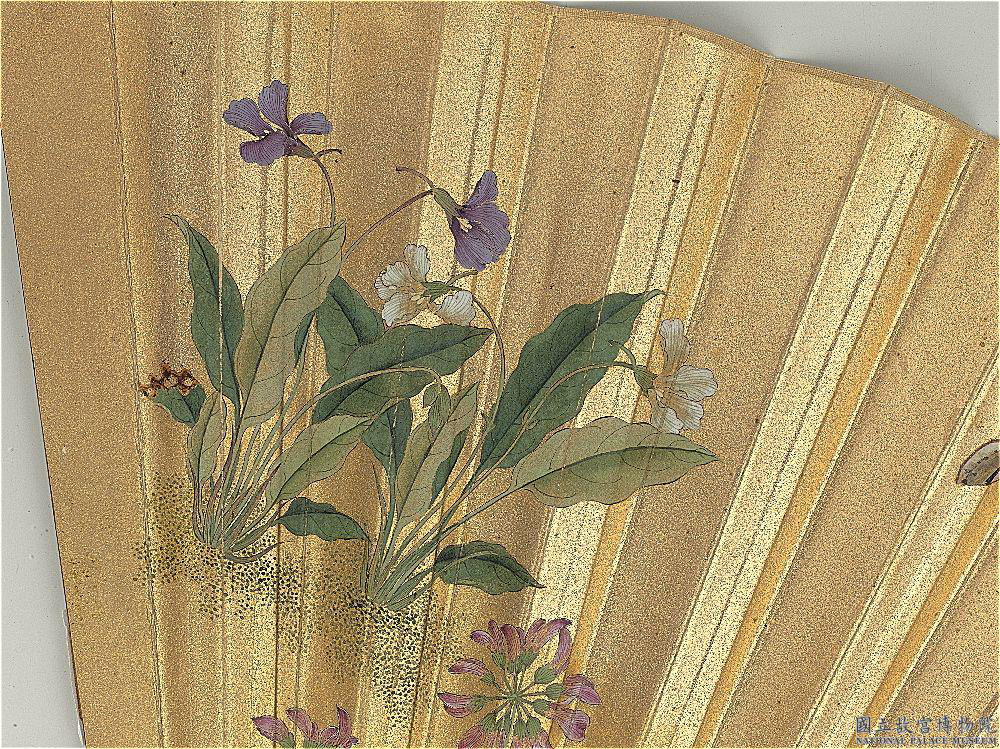

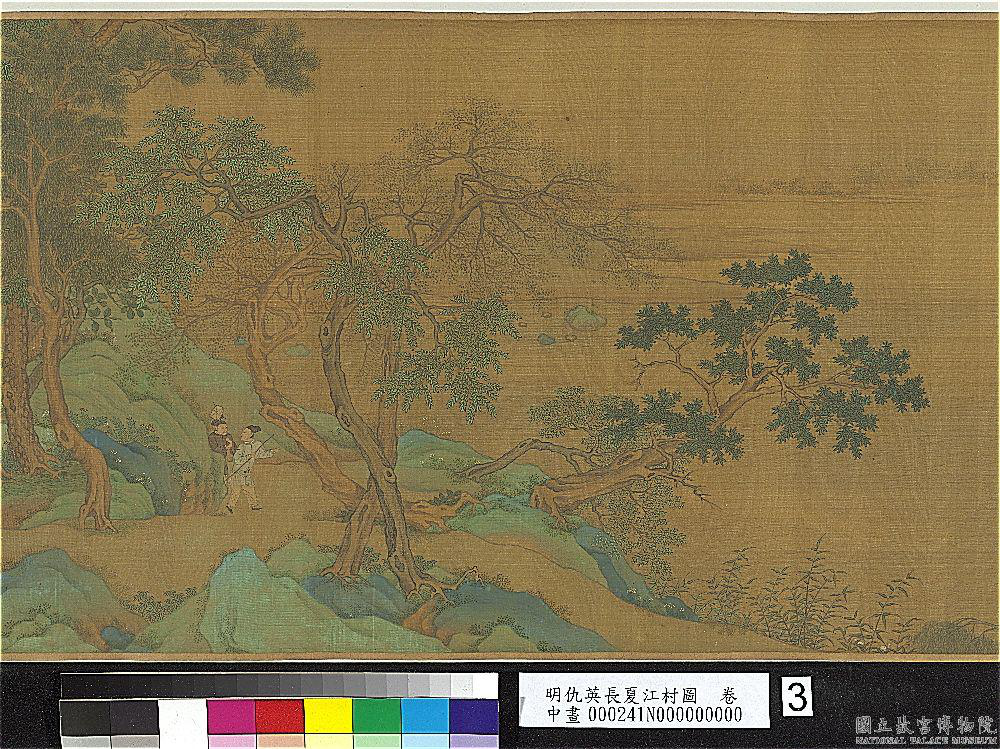

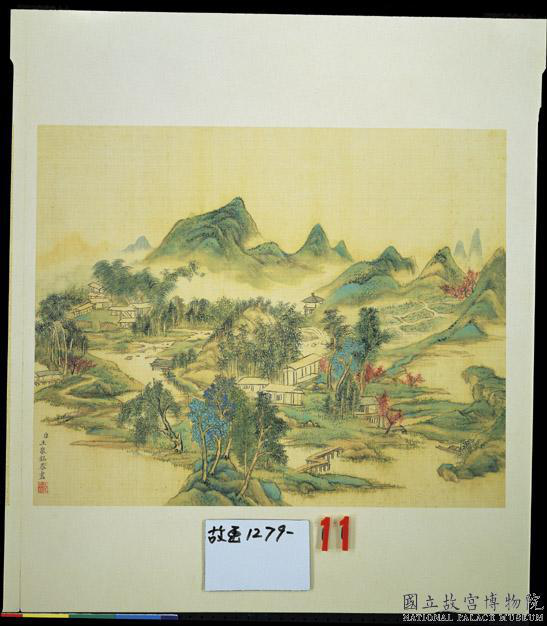

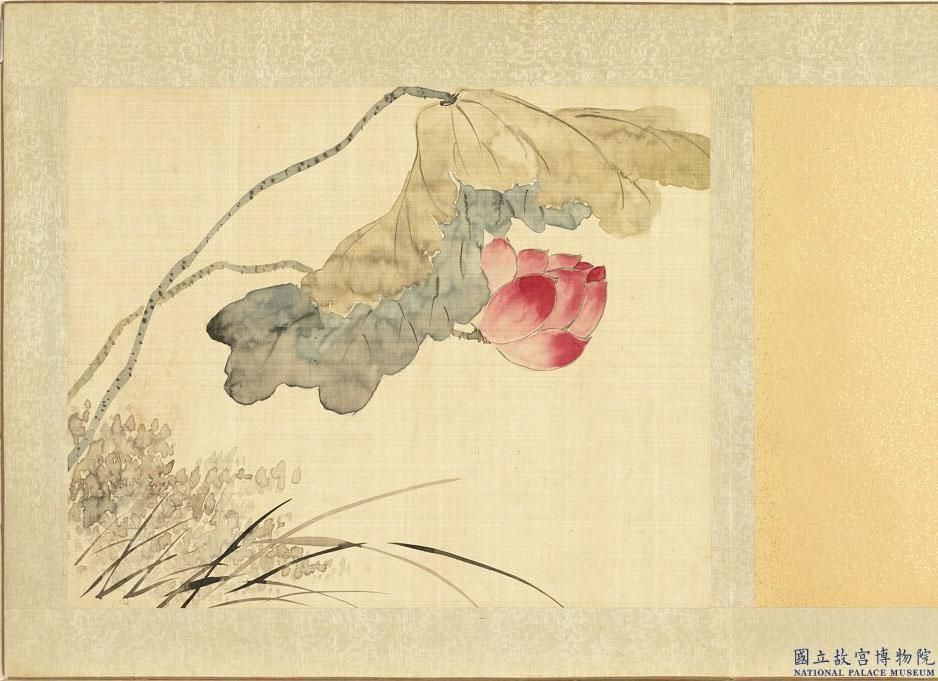

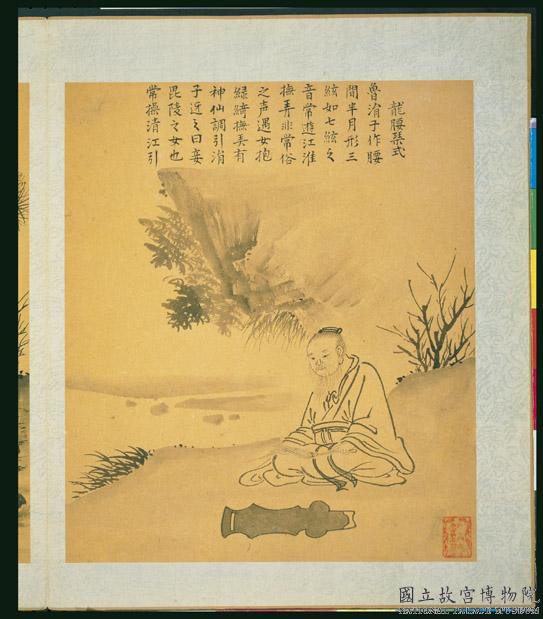

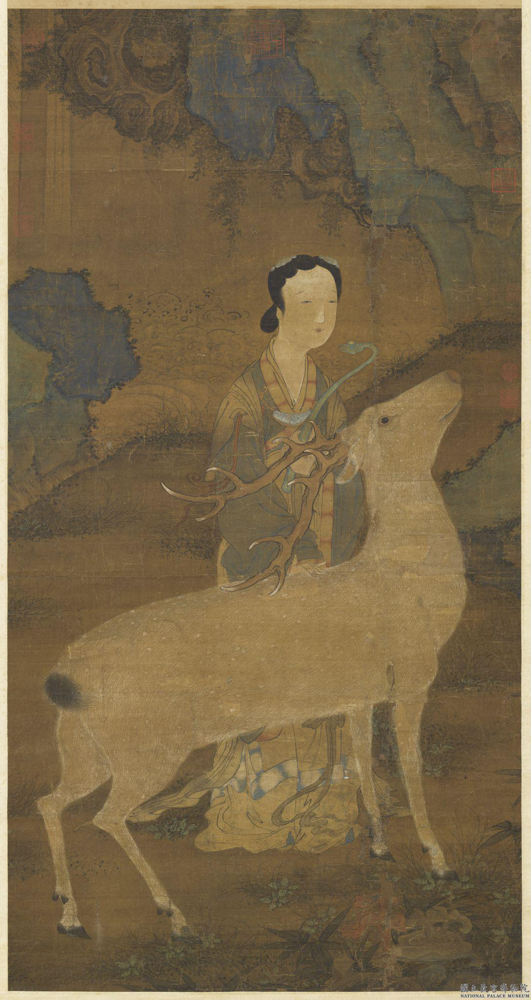

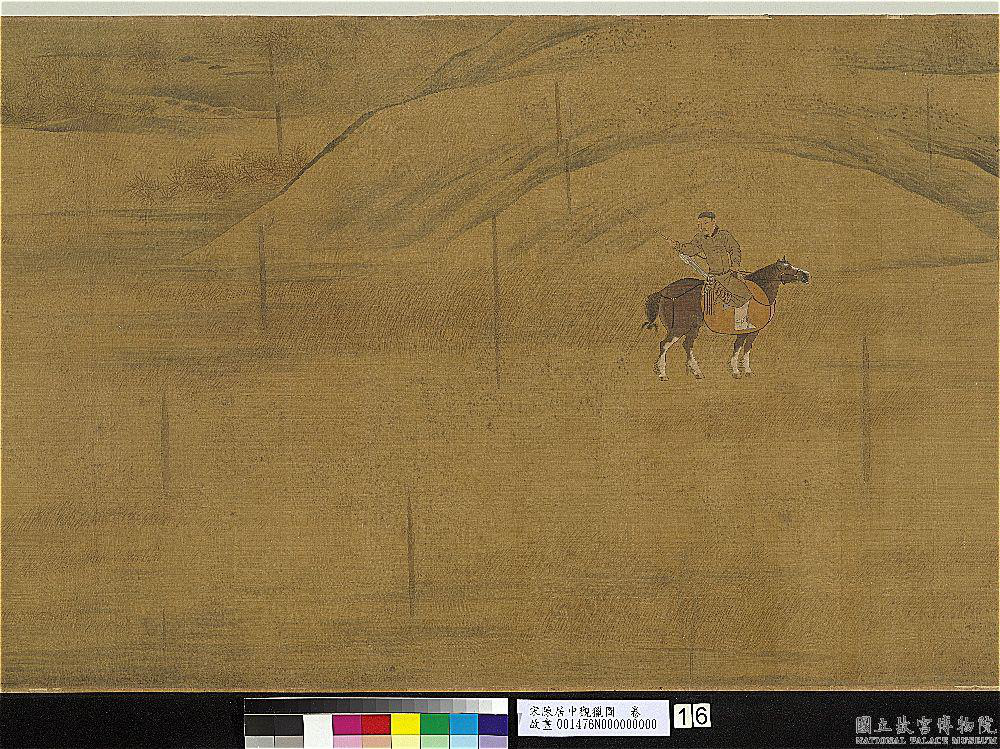

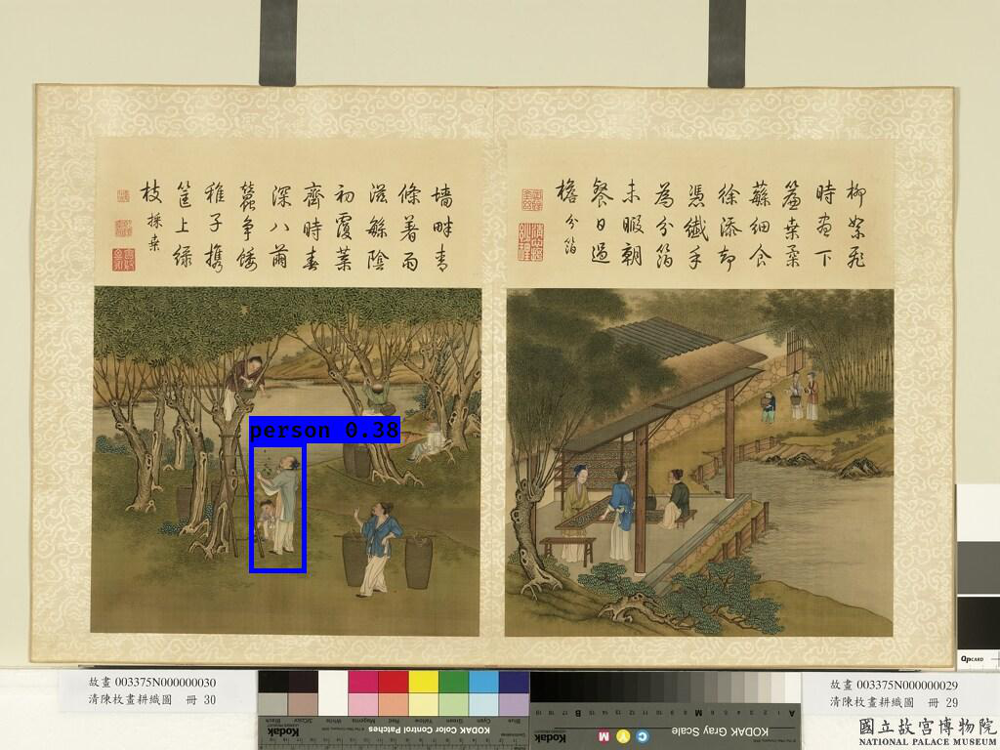

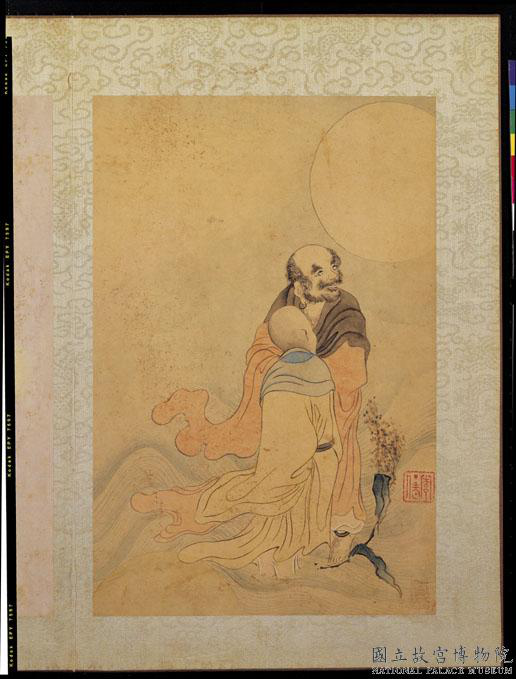

In [12]:
import random, os 
from PIL import Image
from yolo_video_ import detect_img_many, path_construct
class_path = 'model_data/oldDrawingClasses.txt'
log_dir = 'logs/'
anchors_path = 'model_data/yolo_anchors.txt'
h5_file = log_dir + 'trained_weights_final.h5'
# 随机在测试集中选取10张图片进行标注
inputs, outputs, gt_files, dr_files = path_construct(10)
detect_img_many(h5_file, anchors_path, class_path, inputs, outputs, gt_files, dr_files)
# 显示标注结果
from IPython.display import display
for output in outputs:
    display(Image.open(output))